In [1]:
import pandas as pd
from autoviz import AutoViz_Class

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

Imported v0.1.604. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


### Dataset

In [2]:
data = pd.read_excel('../data/seoul+bike+sharing+demand.xlsx')
target_variable = 'Rented Bike Count'
print(data.shape)
data.head()

(8760, 14)


,Date,Hour,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-01-12 00:00:00,0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-01-12 00:00:00,1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-01-12 00:00:00,2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-01-12 00:00:00,3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-01-12 00:00:00,4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [3]:
data.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Hour                       8760 non-null   int64  
 2   Rented Bike Count          8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [4]:
# add hours to the date tiem field
data['Date'] = pd.to_datetime(data['Date'])
data['Date'] = pd.to_datetime(dict(year=data['Date'].dt.year, month=data['Date'].dt.month, day=data['Date'].dt.day, hour=data['Hour']))
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day_of_week
cols_to_convert = ['Humidity(%)', 'Visibility (10m)']
data[cols_to_convert] = data[cols_to_convert].astype('float')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Hour                       8760 non-null   int64         
 2   Rented Bike Count          8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   float64       
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   float64       
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

### Some manual visualization

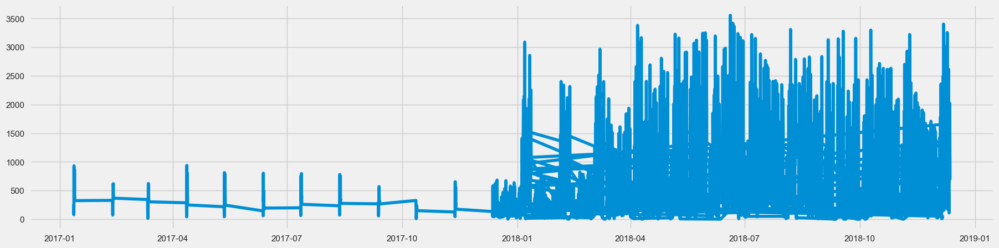

In [5]:
fig, ax = plt.subplots(figsize=(20,5))
ax.plot(data['Date'], data[target_variable])
# sns.lineplot(data=data, x="Date", y=target_variable, ax=ax)
plt.show()

(200, 16)


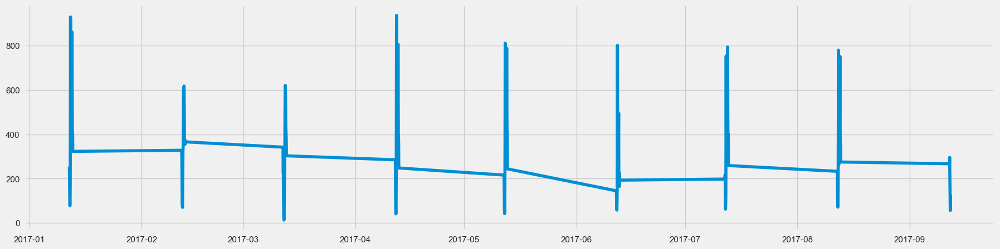

In [6]:
# smaller window of time
fig, ax = plt.subplots(figsize=(20,5))
first_months = data.iloc[:200]
print(first_months.shape)
ax.plot(first_months['Date'], first_months[target_variable])
plt.show()

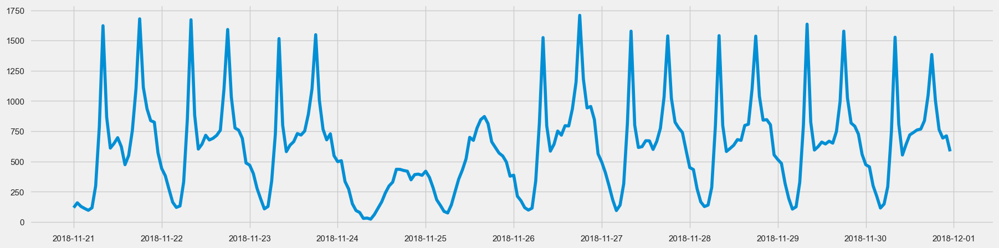

In [14]:
# smaller window of time
fig, ax = plt.subplots(figsize=(20,5))
last_5_days = data.iloc[-240:]
ax.plot(last_5_days['Date'], last_5_days[target_variable])
plt.show()

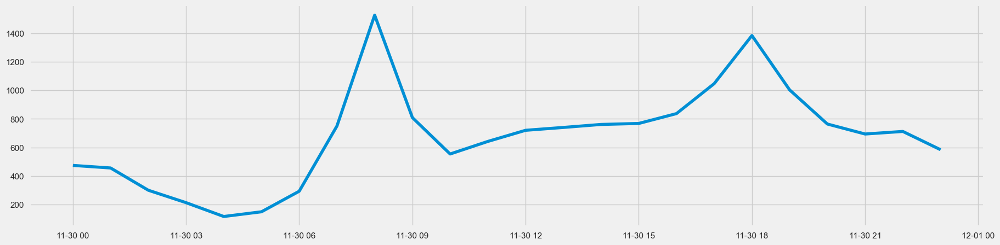

In [12]:
# even smaller window of time
fig, ax = plt.subplots(figsize=(20,5))
last_day = data.iloc[-24:]
ax.plot(last_day['Date'], last_day[target_variable])
plt.show()

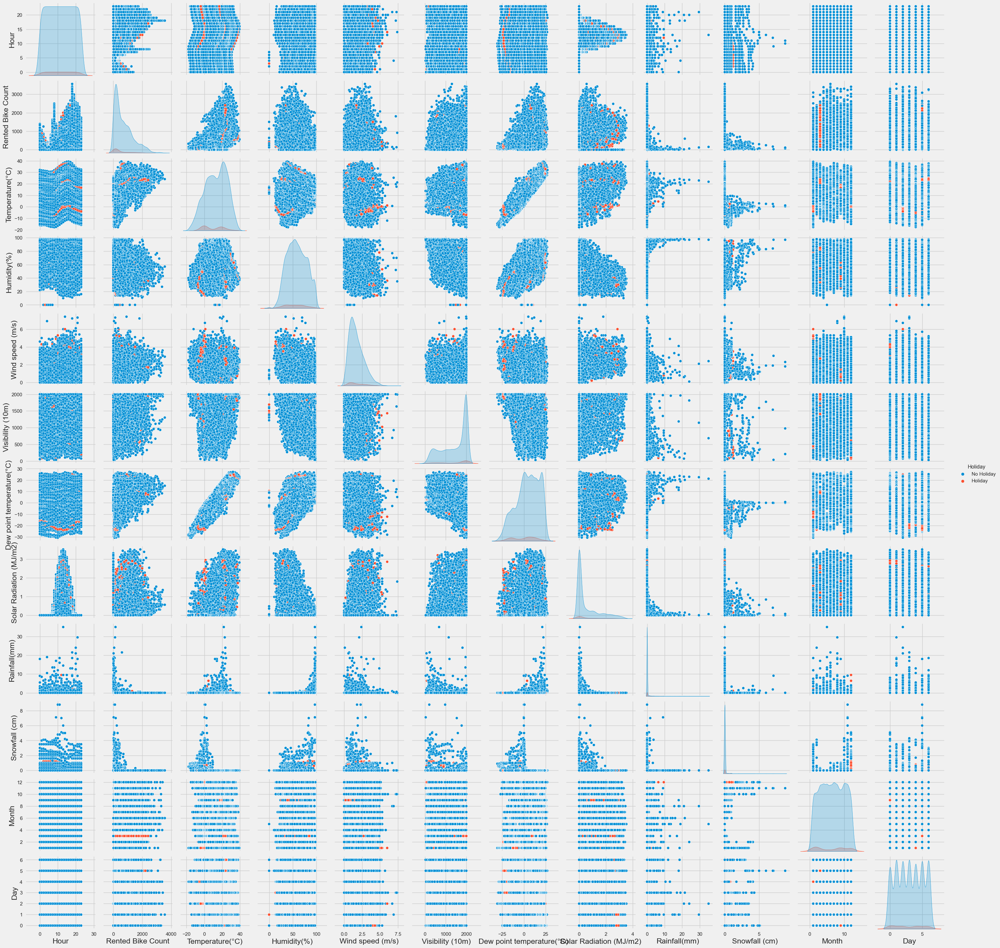

In [9]:
sns.pairplot(data.drop(columns=['Date']), hue='Holiday' )

### Auto Visualization

In [10]:
AV = AutoViz_Class()
dft = AV.AutoViz(
    "",
    sep=',',
    depVar=target_variable,
    dfte=data,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="bokeh",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

Shape of your Data Set loaded: (8760, 16)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
Date,0.000000,100.000000,datetime64[ns],8760,0,0,possible ID column: drop
Hour,0.000000,0.273973,int64,24,0,0,
Temperature(°C),0.000000,6.232877,float64,546,0,0,
Humidity(%),0.000000,1.027397,float64,90,0,0,
Wind speed (m/s),0.000000,0.742009,float64,65,0,0,
Visibility (10m),0.000000,20.422374,float64,1789,0,0,
Dew point temperature(°C),0.000000,6.347032,float64,556,0,0,
Solar Radiation (MJ/m2),0.000000,3.938356,float64,345,0,0,right skewed distribution: cap or drop outliers
Rainfall(mm),0.000000,0.696347,float64,61,0,0,highly right skewed distribution: drop outliers or do box-cox transform
Snowfall (cm),0.000000,0.582192,float64,51,0,0,highly right skewed distribution: drop outliers or do box-cox transform


    15 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Regression problem #####################


Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Temperature(°C)', ...], value='Temperature(°C)', width=250)
            [1] VSpacer()

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Temperature(°C)', ...], value='Temperature(°C)')
        [1] Select(name='Y-Axis', options=['Temperature(°C)', ...], value='Humidity(%)')
        [2] Select(name='Color', options=['None', 'Rented B...], value='None')
    [1] ParamFunction(function, _pane=HoloViews)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=300, sizing_mode='fixed', width=700)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Seasons', 'Hour', ...], value='Seasons', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Snowfall (cm)', ...], value='Snowfall (cm)', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Violin, height=300, sizing_mode='fixed', width=700)

HoloViews(Overlay, height=500, sizing_mode='fixed', width=600)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Date'], value='Date')
        [1] Select(name='Y-Axis', options=['Temperature(°C)', ...], value='Temperature(°C)')
    [1] ParamFunction(function, _pane=HoloViews)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Seasons', 'Hour', ...], value='Seasons')
        [1] Select(name='Y-Axis', options=['Temperature(°C)', ...], value='Temperature(°C)')
    [1] ParamFunction(function, _pane=HoloViews)

Time to run AutoViz (in seconds) = 4
